In [37]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import numpy as np

import torch
from torch.utils.data import DataLoader
import torch.utils.data as data_utils
from optimizers import PSPS

import matplotlib.pyplot as plt

from datasets import get_dataset    
from loss_fns import get_loss
from utils import solve

from torch.optim import SGD, Adam, Adagrad, Adadelta, RMSprop
from torch_optimizer import Adahessian

from loss_functions import logreg, grad_logreg, hess_logreg, nllsq

torch.set_default_dtype(torch.float64)

from sklearn.datasets import load_svmlight_file

%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [38]:
device = torch.device('cpu')

In [39]:
def rademacher_old(weights):
    return torch.round(torch.rand_like(weights)) * 2 - 1

def diag_estimate_old(weights, grad, iters):
    Ds = []
    for j in range(iters):
        z = rademacher_old(weights)
        with torch.no_grad():
            hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
        Ds.append((hvp*z))

    return torch.mean(torch.stack(Ds), 0)

def citardouq_solve(a, b, c):
    det = b * b - 4 * a * c
    if det < 1e-40:
        x1 = 0.0
        x2 = 0.0
    else:
        x1 = (2 * c) / (-b - np.sqrt(det))
        x2 = (2 * c) / (-b + np.sqrt(det))
    return np.asarray([x1, x2])

In [40]:
batch_size = 64
# dataset_name = "covtype.libsvm.binary"
dataset_name = "mushrooms"
percentage = 1.0

EPOCHS = 100
# train_dataloader, train_data, train_target = get_dataset(dataset_name, batch_size, scale_data)
datasets_path = os.getenv("DATASETS_DIR")
trainX, trainY = load_svmlight_file(f"{datasets_path}/{dataset_name}")
sample = np.random.choice(trainX.shape[0], round(trainX.shape[0] * percentage), replace=False)

assert sample.shape == np.unique(sample).shape

trainX = trainX[sample]
trainY = trainY[sample]

train_data = torch.tensor(trainX.toarray())
train_target = torch.tensor(trainY)

# CHANGE THIS ACCODRING TO DATASET AND LOSS FUNCTION
train_target[train_target == 2.] == -1.

train_load = data_utils.TensorDataset(train_data, train_target)
train_dataloader = DataLoader(train_load, batch_size=batch_size, shuffle=True)


scale = 5
r1 = -scale
r2 = scale
scaling_vec = (r1 - r2) * torch.rand(train_data.shape[1]) + r2
scaling_vec = torch.pow(torch.e, scaling_vec)
train_data_scaled = scaling_vec * train_data

train_load_scaled = data_utils.TensorDataset(train_data_scaled, train_target)
train_dataloader_scaled = DataLoader(train_load_scaled, batch_size=batch_size, shuffle=True)

In [41]:
func = logreg
grad = grad_logreg
hess = hess_logreg

In [48]:
def run_optimizer(optim, lr):
   
    # parameters
    w = torch.zeros(train_data.shape[1], device=device).requires_grad_()
    optimizer = optim([w], lr=lr)

    # save loss and grad size to history
    hist = []
    loss = func(w, train_data, train_target)
    g, = torch.autograd.grad(loss, w, create_graph=True)
    print(f"Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")
    hist.append([loss.item(), (torch.linalg.norm(g) ** 2).item()])

    for step in range(EPOCHS):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            optimizer.zero_grad()
            loss = func(w, batch_data, batch_target)
            if isinstance(optimizer, Adahessian): 
                loss.backward(create_graph=True)
            else:
                loss.backward()
            optimizer.step()

        loss = func(w, train_data, train_target)
        g, = torch.autograd.grad(loss, w, create_graph=True)
        hist.append([loss.item(), (torch.linalg.norm(g) ** 2).item()])

        if step % 10 == 0 or step == EPOCHS-1:
            print(f"Epoch [{step}] | Loss: {loss.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")

    return hist

In [46]:
def sgd(train_data, train_target, train_dataloader, lr):

    w = torch.zeros(train_data.shape[1])


    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)
    
    hist = [[loss.item(), torch.sum(torch.square(g)).item()]]

    for epoch in range(EPOCHS):

        for batch_data, batch_target in train_dataloader:

            loss = func(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)

            with torch.no_grad():
                w.sub_(lr * g)
        
        loss = func(w, train_data, train_target)
        g = grad(w, train_data, train_target)

        hist.append([loss.item(), torch.sum(torch.square(g)).item()])

    return hist

In [47]:
def sps(train_data, train_target, train_dataloader, precond_method="none", init_hutch=10000):
    
    def hess_diag_approx(weights, grad, iters):
        Ds = torch.zeros_like(weights)
        for j in range(iters):
            z = rademacher_old(weights)
            with torch.no_grad():
                hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
            Ds.add_(hvp*z)
        return Ds.div(iters)

    w = torch.zeros(train_data.shape[1]).requires_grad_()

    loss = func(w, train_data, train_target)
    g = torch.autograd.grad(loss, w, create_graph=True)[0]

    if precond_method == "none":
        precond = torch.ones(train_data.shape[1])
    elif precond_method == "hessdiag":
        hessian = hess(w, train_data, train_target)
        hessian_diag = torch.diag(hessian)
        precond = 1 / hessian_diag
    elif precond_method == "scaling_vec":
        precond = (1 / scaling_vec)**2
    elif precond_method == "hutch":
        hessian = hess(train_data)
        hessian_diag = torch.diag(hessian)
        D = hess_diag_approx(w, g, init_hutch)
        beta = 0.999
        alpha = 0.01
        # D = torch.relu(D)
        # D = torch.abs(D)
        # D[D < alpha] = alpha    
        D_inv = 1 / D
        precond = D_inv

    hist = [[loss.item(), torch.sum(torch.square(g)).item()]]
        
    for epoch in range(EPOCHS):

        for batch_data, batch_target in train_dataloader:

            loss = func(w, batch_data, batch_target)
            g = torch.autograd.grad(loss, w, create_graph=True)[0]

            if precond_method == "hutch":
                v = hess_diag_approx(w, g, 1)
                D = beta * D + (1 - beta) * v
                # D = torch.abs(D)
                # D[D < alpha] = alpha    
                # D = torch.relu(D)
                D_inv =  1 / D
                precond = D_inv
                # print(f"norm(hessian_diag - D): { torch.norm(hessian_diag - D) }")

            weighted_grad_norm =  torch.dot(g, precond * g)

            ps = loss / weighted_grad_norm

            with torch.no_grad():
                w.sub_(ps * precond * g)
        
        loss = func(w, train_data, train_target)
        g = grad(w, train_data, train_target)

        hist.append([loss.item(), torch.sum(torch.square(g)).item()])

    return hist

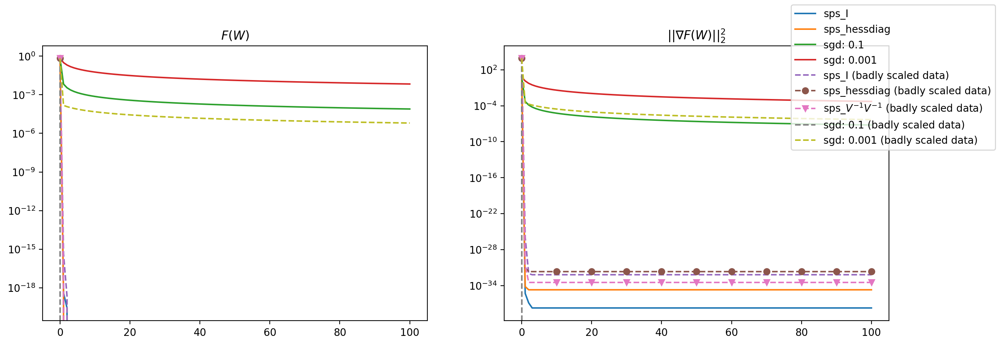

In [35]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=200)

h = sps(train_data, train_target, train_dataloader, "none")
ax1.semilogy([x[0] for x in h], label="sps_I")
ax2.semilogy([x[1] for x in h])

h = sps(train_data, train_target, train_dataloader, "hessdiag")
ax1.semilogy([x[0] for x in h], label="sps_hessdiag")
ax2.semilogy([x[1] for x in h])


for i in [1e-1, 1e-3]:
    h = sgd(train_data, train_target, train_dataloader, i)
    ax1.semilogy([x[0] for x in h], label=f"sgd: {i}")
    ax2.semilogy([x[1] for x in h])


h = sps(train_data_scaled, train_target, train_dataloader_scaled, "none")
ax1.semilogy([x[0] for x in h], linestyle="--", label="sps_I (badly scaled data)")
ax2.semilogy([x[1] for x in h], linestyle="--")

h = sps(train_data_scaled, train_target, train_dataloader_scaled, "hessdiag")
markevery = [x for x in range(0, len(h), 10)]  
ax1.semilogy([x[0] for x in h], linestyle="--", marker="o", markevery=markevery, label="sps_hessdiag (badly scaled data)")
ax2.semilogy([x[1] for x in h], linestyle="--", marker="o", markevery=markevery)

h = sps(train_data_scaled, train_target, train_dataloader_scaled, "scaling_vec")
markevery = [x for x in range(0, len(h), 10)]  
ax1.semilogy([x[0] for x in h], linestyle="--", marker="v", markevery=markevery, label=r"sps_$V^{-1}V^{-1}$ (badly scaled data)")
ax2.semilogy([x[1] for x in h], linestyle="--", marker="v", markevery=markevery)


for i in [1e-1, 1e-3]:
    h = sgd(train_data_scaled, train_target, train_dataloader_scaled, i)
    ax1.semilogy([x[0] for x in h], linestyle="--", label=f"sgd: {i} (badly scaled data)")
    ax2.semilogy([x[1] for x in h], linestyle="--")


ax1.set_title(r"$F(W)$")
ax2.set_title(r"$\|\| \nabla F(W) \|\|^2_2$")

fig.legend()

In [ ]:
adam_hist = []
EPOCHS = 50
for lr in np.arange(0.0000, 4.0, 0.005):
    print(lr)
    adam_hist.append(run_optimizer(Adam, lr)[-1][0])

In [62]:
sps_hessdiag = sps(train_data, train_target, train_dataloader, "hessdiag")

In [72]:
adam_hist, len(adam_hist)

([[0.6931471805599453, 6.057377027322154],
  [3.7160855323100707e-06, 1.4805227212052835e-10],
  [1.3637059673418063e-06, 2.000890971557859e-11],
  [7.774371080322268e-07, 6.6403777687766985e-12],
  [5.585277392303568e-07, 3.4028464832832677e-12],
  [4.150511871459269e-07, 1.8316639774816906e-12],
  [3.185073090208474e-07, 1.1097987468811961e-12],
  [2.6814441720052293e-07, 7.76250097335709e-13],
  [2.1071529754203815e-07, 4.861129657380013e-13],
  [1.6319116357040115e-07, 2.9121413272195305e-13]],
 10)

In [254]:
def hess_diag_approx(weights, grad, iters):
        Ds = torch.zeros_like(weights)
        for j in range(iters):
            z = rademacher_old(weights)
            with torch.no_grad():
                hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
            Ds.add_(hvp*z)

        return Ds.div(iters)

w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)


hessian = hess(train_data)
hessian_diag = torch.diag(hessian)
hessian_diag_inv = 1 / hessian_diag


# Hutch
beta = 0.999


diff = []

for i in range(0, 10000, 100):
    D = hess_diag_approx(w, g, i)
    diff.append(torch.norm(hessian_diag - D).item())
    print(f"norm(hessian_diag - D_{i}) = {torch.norm(hessian_diag - D)}")


v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


# hist = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
# for epoch in range(EPOCHS):

#     for batch_data, batch_target in train_dataloader:

#         loss = func(w, batch_data, batch_target)
#         # g = grad(w, batch_data, batch_target)
#         g = torch.autograd.grad(loss, w, create_graph=True)[0]

#         v = hess_diag_approx(w, g, 1)

#         # Smoothing and Truncation 
#         D = beta * D + (1 - beta) * v
#         print(f"norm(hessian_diag - D_{100 + epoch + 1}) = {torch.norm(hessian_diag - D)}")

#         D_inv =  1 / D

#         precond = D_inv
#         weighted_grad_norm =  torch.dot(g, precond * g)

#         ps = loss / weighted_grad_norm

#         with torch.no_grad():
#             w.sub_(ps * precond * g)
    
#     loss = func(w, train_data, train_target)
#     g = grad(w, train_data, train_target)

#     hist.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D_0) = nan
norm(hessian_diag - D_100) = 0.18288576150178756
norm(hessian_diag - D_200) = 0.1395861724083495
norm(hessian_diag - D_300) = 0.12731738163005907
norm(hessian_diag - D_400) = 0.08471623208115471
norm(hessian_diag - D_500) = 0.11718514840259298
norm(hessian_diag - D_600) = 0.06617188500448412
norm(hessian_diag - D_700) = 0.05493030085080254
norm(hessian_diag - D_800) = 0.05401798686485677
norm(hessian_diag - D_900) = 0.05482859318833883
norm(hessian_diag - D_1000) = 0.05541782991378856
norm(hessian_diag - D_1100) = 0.045976571451173995
norm(hessian_diag - D_1200) = 0.061728295282716665
norm(hessian_diag - D_1300) = 0.03742010111990734
norm(hessian_diag - D_1400) = 0.04397249098906515
norm(hessian_diag - D_1500) = 0.04106635060611759
norm(hessian_diag - D_1600) = 0.0374257505292235
norm(hessian_diag - D_1700) = 0.031178242765061783
norm(hessian_diag - D_1800) = 0.0404018301462588
norm(hessian_diag - D_1900) = 0.027646290851202574
norm(hessian_diag - D_2000)

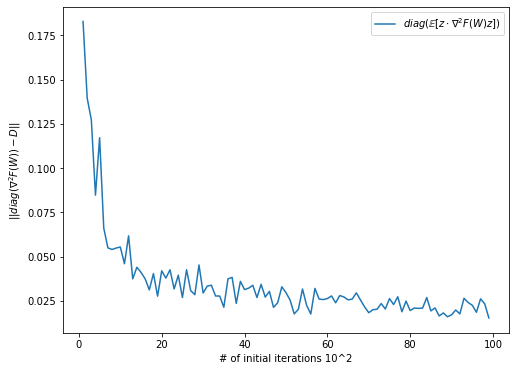

In [259]:
fig = plt.figure(figsize=(8, 6))

plt.plot(diff)


plt.ylabel(r"$\|\| diag(\nabla^2 F(W)) - D  \|\|$")
plt.xlabel("# of initial iterations 10^2")

plt.legend([r"$ diag( \mathbb{E} [ z \cdot \nabla^2 F(W)z ] ) $"])


In [276]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)


hessian = hess(train_data)
hessian_diag = torch.diag(hessian)
hessian_diag_inv = 1 / hessian_diag


# Hutch
beta = 0.999


diff_hutch = []

D = hess_diag_approx(w, g, 100)
diff_hutch.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_hutch = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = hess_diag_approx(w, g, 1)

        # Smoothing and Truncation 
        D = beta * D + (1 - beta) * v
        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")
        diff_hutch.append(torch.norm(hessian_diag - D).item())

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_hutch.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.17810073509155258
1 / 10000: norm(hessian_diag - D) = 0.17742861234437018
2 / 10000: norm(hessian_diag - D) = 0.17747252541741587
3 / 10000: norm(hessian_diag - D) = 0.17697687504143925
4 / 10000: norm(hessian_diag - D) = 0.1764507538526313
5 / 10000: norm(hessian_diag - D) = 0.17683474492477366
6 / 10000: norm(hessian_diag - D) = 0.1759406690421215
7 / 10000: norm(hessian_diag - D) = 0.17599420081937017
8 / 10000: norm(hessian_diag - D) = 0.17584927903015646
9 / 10000: norm(hessian_diag - D) = 0.17597086271603812
10 / 10000: norm(hessian_diag - D) = 0.1763629825634613
11 / 10000: norm(hessian_diag - D) = 0.1762159084658909
12 / 10000: norm(hessian_diag - D) = 0.17629068047613736
13 / 10000: norm(hessian_diag - D) = 0.17598649632020308
14 / 10000: norm(hessian_diag - D) = 0.17536765319778003
15 / 10000: norm(hessian_diag - D) = 0.17449861014671006
16 / 10000: norm(hessian_diag - D) = 0.17438872331320224
17 / 10000: norm(hessian_diag - D) = 0.17466268098145882

In [277]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)

diff_hutch_sqrt = []

D = hess_diag_approx(w, g, 100)
diff_hutch_sqrt.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_hutch_sqrt = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = hess_diag_approx(w, g, 1)

        # Smoothing and Truncation 
        D = torch.sqrt(beta * D + (1 - beta) * v)
        diff_hutch_sqrt.append(torch.norm(hessian_diag - D).item())

        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_hutch_sqrt.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.23533663628704088
1 / 10000: norm(hessian_diag - D) = 0.3663251561943287
2 / 10000: norm(hessian_diag - D) = 0.48416204317911177
3 / 10000: norm(hessian_diag - D) = 0.5474778462348782
4 / 10000: norm(hessian_diag - D) = 0.5796457699269717
5 / 10000: norm(hessian_diag - D) = 0.5961973450754241
6 / 10000: norm(hessian_diag - D) = 0.6043298901461933
7 / 10000: norm(hessian_diag - D) = 0.6088637254543268
8 / 10000: norm(hessian_diag - D) = 0.6106325954907114
9 / 10000: norm(hessian_diag - D) = 0.611558554033461
10 / 10000: norm(hessian_diag - D) = 0.6120870440303671
11 / 10000: norm(hessian_diag - D) = 0.6123139639961291
12 / 10000: norm(hessian_diag - D) = 0.612825715973175
13 / 10000: norm(hessian_diag - D) = 0.6128681790449673
14 / 10000: norm(hessian_diag - D) = 0.6128783911957375
15 / 10000: norm(hessian_diag - D) = 0.6128622092519779
16 / 10000: norm(hessian_diag - D) = 0.6128215793234014
17 / 10000: norm(hessian_diag - D) = 0.6128186098070205
18 / 10000: n

In [270]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)

diff_adahessian = []

D = hess_diag_approx(w, g, 100)
D_sum = D.detach().clone()
diff_adahessian.append(torch.norm(hessian_diag - D).item())
k = 1
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_adahessian = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = torch.square(hess_diag_approx(w, g, 1))
        D_sum = D_sum + (beta**k * v)
        t = (1 - beta) / (1 - beta**k) 
        D = torch.sqrt( t * D_sum )
        diff_adahessian.append(torch.norm(hessian_diag - D).item())

        k += 1

        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_adahessian.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.20943128011182754
1 / 10000: norm(hessian_diag - D) = 2.309514434386823
2 / 10000: norm(hessian_diag - D) = 1.6454643097316914
3 / 10000: norm(hessian_diag - D) = 1.5067379513288122
4 / 10000: norm(hessian_diag - D) = 1.3005864891016385
5 / 10000: norm(hessian_diag - D) = 1.1526054926542235
6 / 10000: norm(hessian_diag - D) = 1.2444988472103582
7 / 10000: norm(hessian_diag - D) = 1.1448225914073527
8 / 10000: norm(hessian_diag - D) = 1.0049304310845015
9 / 10000: norm(hessian_diag - D) = 0.9740758304796006
10 / 10000: norm(hessian_diag - D) = 0.9460535328049795
11 / 10000: norm(hessian_diag - D) = 0.935099019225566
12 / 10000: norm(hessian_diag - D) = 0.9005007454068239
13 / 10000: norm(hessian_diag - D) = 0.8891377283505831
14 / 10000: norm(hessian_diag - D) = 0.8843137627976283
15 / 10000: norm(hessian_diag - D) = 0.9121188975083409
16 / 10000: norm(hessian_diag - D) = 0.9922536934440249
17 / 10000: norm(hessian_diag - D) = 0.9657241564433848
18 / 10000: no

In [271]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)

diff_adahessian_nosqrt = []

D = hess_diag_approx(w, g, 100)
D_sum = D.detach().clone()
diff_adahessian_nosqrt.append(torch.norm(hessian_diag - D).item())
k = 1
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_adahessian_nosqrt = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = torch.square(hess_diag_approx(w, g, 1))
        D_sum = D_sum + (beta**k * v)
        t = (1 - beta) / (1 - beta**k) 
        D = t * D_sum 
        diff_adahessian_nosqrt.append(torch.norm(hessian_diag - D).item())

        k += 1

        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_adahessian_nosqrt.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.19389143377637272
1 / 10000: norm(hessian_diag - D) = 7.618479380041694
2 / 10000: norm(hessian_diag - D) = 4.681911092188507
3 / 10000: norm(hessian_diag - D) = 3.1536686331872392
4 / 10000: norm(hessian_diag - D) = 2.6911248566268267
5 / 10000: norm(hessian_diag - D) = 2.0737035230420564
6 / 10000: norm(hessian_diag - D) = 1.5574323463749622
7 / 10000: norm(hessian_diag - D) = 1.8780044469429715
8 / 10000: norm(hessian_diag - D) = 1.9705769752975415
9 / 10000: norm(hessian_diag - D) = 2.0909781923749886
10 / 10000: norm(hessian_diag - D) = 2.094275818008108
11 / 10000: norm(hessian_diag - D) = 1.812297171990369
12 / 10000: norm(hessian_diag - D) = 1.7214968470485226
13 / 10000: norm(hessian_diag - D) = 1.603243881615322
14 / 10000: norm(hessian_diag - D) = 1.533235909775817
15 / 10000: norm(hessian_diag - D) = 1.4995704005858026
16 / 10000: norm(hessian_diag - D) = 1.4230693295690042
17 / 10000: norm(hessian_diag - D) = 1.3627694371681165
18 / 10000: norm(h

In [273]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)

diff_adagrad = []

D_sum = torch.zeros(A.shape[1])
D = torch.sqrt(D_sum)
diff_adagrad.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

hist_adagrad = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        D_sum += torch.square(g)
        D = torch.sqrt(D_sum)
        diff_adagrad.append(torch.norm(hessian_diag - D).item())

        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_adagrad.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 4.5945870286186645
1 / 10000: norm(hessian_diag - D) = 3.928925661908301
2 / 10000: norm(hessian_diag - D) = 4.478933633556345
3 / 10000: norm(hessian_diag - D) = 4.814064487233354
4 / 10000: norm(hessian_diag - D) = 4.9306815831709105
5 / 10000: norm(hessian_diag - D) = 5.001603669358685
6 / 10000: norm(hessian_diag - D) = 5.047196098222312
7 / 10000: norm(hessian_diag - D) = 5.070902103824254
8 / 10000: norm(hessian_diag - D) = 5.087293161339307
9 / 10000: norm(hessian_diag - D) = 5.097211940237378
10 / 10000: norm(hessian_diag - D) = 5.102341087889878
11 / 10000: norm(hessian_diag - D) = 5.1062609170426905
12 / 10000: norm(hessian_diag - D) = 5.107448439798541
13 / 10000: norm(hessian_diag - D) = 5.108391118857786
14 / 10000: norm(hessian_diag - D) = 5.108670348215259
15 / 10000: norm(hessian_diag - D) = 5.1088949732842375
16 / 10000: norm(hessian_diag - D) = 5.108961456308246
17 / 10000: norm(hessian_diag - D) = 5.109017727442719
18 / 10000: norm(hessian_di

In [275]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)

diff_adagrad_nosqrt = []

D_sum = torch.zeros(A.shape[1])
D = D_sum
diff_adagrad_nosqrt.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

hist_adagrad_nosqrt = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        D_sum += torch.square(g)
        D = D_sum
        diff_adagrad_nosqrt.append(torch.norm(hessian_diag - D).item())

        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_adagrad_nosqrt.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 4.5945870286186645
1 / 10000: norm(hessian_diag - D) = 12.51978916847781
2 / 10000: norm(hessian_diag - D) = 512.749279575651
3 / 10000: norm(hessian_diag - D) = 1012.7361214538647
4 / 10000: norm(hessian_diag - D) = 1402.3128515702406
5 / 10000: norm(hessian_diag - D) = 1727.7199063916705
6 / 10000: norm(hessian_diag - D) = 1963.2086554609555
7 / 10000: norm(hessian_diag - D) = 2174.871490871767
8 / 10000: norm(hessian_diag - D) = 2331.8564149746126
9 / 10000: norm(hessian_diag - D) = 2461.6313980003156
10 / 10000: norm(hessian_diag - D) = 2527.116593977782
11 / 10000: norm(hessian_diag - D) = 2575.5435157079905
12 / 10000: norm(hessian_diag - D) = 2607.555509671695
13 / 10000: norm(hessian_diag - D) = 2635.717824383467
14 / 10000: norm(hessian_diag - D) = 2659.1016418054933
15 / 10000: norm(hessian_diag - D) = 2677.191451284713
16 / 10000: norm(hessian_diag - D) = 2693.297980443364
17 / 10000: norm(hessian_diag - D) = 2705.075960343982
18 / 10000: norm(hessia

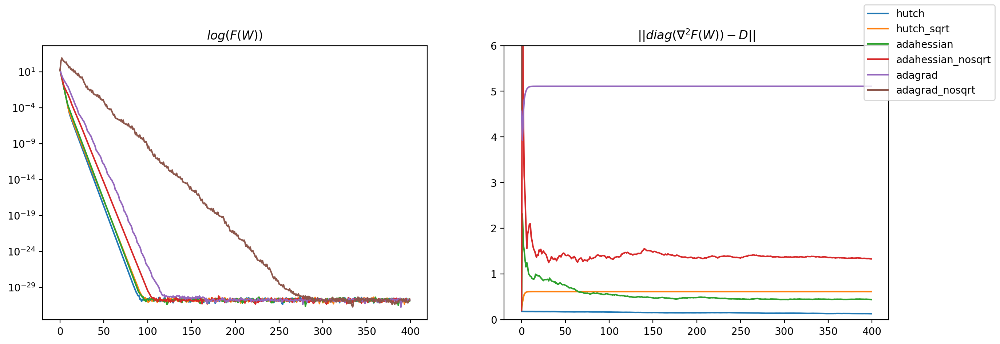

In [302]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=200)

trunc = 400

ax1.semilogy([x[0] for x in hist_hutch[:trunc]])
ax1.semilogy([x[0] for x in hist_hutch_sqrt[:trunc]])
ax1.semilogy([x[0] for x in hist_adahessian[:trunc]])
ax1.semilogy([x[0] for x in hist_adahessian_nosqrt[:trunc]])
ax1.semilogy([x[0] for x in hist_adagrad[:trunc]])
ax1.semilogy([x[0] for x in hist_adagrad_nosqrt[:trunc]])

ax2.plot(diff_hutch[:trunc])
ax2.plot(diff_hutch_sqrt[:trunc])
ax2.plot(diff_adahessian[:trunc])
ax2.plot(diff_adahessian_nosqrt[:trunc])
ax2.plot(diff_adagrad[:trunc])
ax2.plot(diff_adagrad_nosqrt[:trunc])

ax1.set_title(r"$ log(F(W)) $")
ax2.set_title(r"$\|\| diag(\nabla^2 F(W)) - D  \|\|$")

ax2.set_ylim(0, 6)

fig.legend(["hutch", "hutch_sqrt", "adahessian", "adahessian_nosqrt", "adagrad", "adagrad_nosqrt"])

In [306]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)

diff_adam = []

D = torch.zeros_like(g)
D_sum =  torch.zeros_like(g)
k = 1
diff_adam.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

hist_adam = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        D_sum =  D_sum + (beta**k) * torch.square(g)
        t = (1 - beta) / (1 - beta**k)
        D = torch.sqrt( t * D_sum )
        diff_adam.append(torch.norm(hessian_diag - D).item())

        k += 1

        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_adam.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 4.5945870286186645
1 / 10000: norm(hessian_diag - D) = 3.9265649829640688
2 / 10000: norm(hessian_diag - D) = 2.9619810084887974
3 / 10000: norm(hessian_diag - D) = 2.6972108677314823
4 / 10000: norm(hessian_diag - D) = 2.574283692377264
5 / 10000: norm(hessian_diag - D) = 2.563771312924517
6 / 10000: norm(hessian_diag - D) = 2.58934336664575
7 / 10000: norm(hessian_diag - D) = 2.639920677022257
8 / 10000: norm(hessian_diag - D) = 2.692023298059728
9 / 10000: norm(hessian_diag - D) = 2.7514550185898368
10 / 10000: norm(hessian_diag - D) = 2.8049057231482335
11 / 10000: norm(hessian_diag - D) = 2.859542423212905
12 / 10000: norm(hessian_diag - D) = 2.9094201406375064
13 / 10000: norm(hessian_diag - D) = 2.956814333850277
14 / 10000: norm(hessian_diag - D) = 3.0006131108471163
15 / 10000: norm(hessian_diag - D) = 3.0415684456095637
16 / 10000: norm(hessian_diag - D) = 3.079648416576613
17 / 10000: norm(hessian_diag - D) = 3.115234544695634
18 / 10000: norm(hessia

In [307]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)

diff_adam_nosqrt = []

D = torch.zeros_like(g)
D_sum =  torch.zeros_like(g)
k = 1
diff_adam_nosqrt.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

hist_adam_nosqrt = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        D_sum =  D_sum + (beta**k) * torch.square(g)
        t = (1 - beta) / (1 - beta**k)
        D = t * D_sum
        diff_adam_nosqrt.append(torch.norm(hessian_diag - D).item())

        k += 1

        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_adam_nosqrt.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 4.5945870286186645
1 / 10000: norm(hessian_diag - D) = 12.505542932551208
2 / 10000: norm(hessian_diag - D) = 255.3627630749977
3 / 10000: norm(hessian_diag - D) = 335.0784642153305
4 / 10000: norm(hessian_diag - D) = 347.8431582926357
5 / 10000: norm(hessian_diag - D) = 342.873772488872
6 / 10000: norm(hessian_diag - D) = 324.54155074835097
7 / 10000: norm(hessian_diag - D) = 308.159393070938
8 / 10000: norm(hessian_diag - D) = 288.947640368754
9 / 10000: norm(hessian_diag - D) = 271.121982289219
10 / 10000: norm(hessian_diag - D) = 250.33113044364376
11 / 10000: norm(hessian_diag - D) = 231.82912529020527
12 / 10000: norm(hessian_diag - D) = 215.06029931187172
13 / 10000: norm(hessian_diag - D) = 200.5691547861508
14 / 10000: norm(hessian_diag - D) = 187.80722210797438
15 / 10000: norm(hessian_diag - D) = 176.39793900246337
16 / 10000: norm(hessian_diag - D) = 166.32378564341116
17 / 10000: norm(hessian_diag - D) = 157.1835112253129
18 / 10000: norm(hessian_d

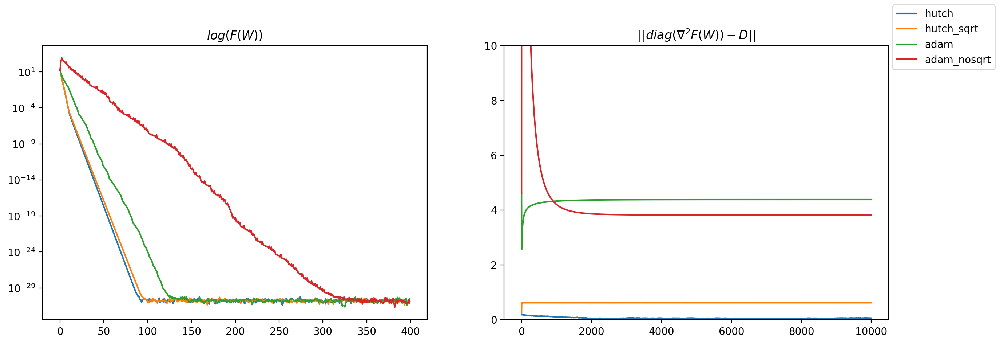

In [316]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=200)

ax1_trunc = 400
ax2_trunc = 10000

ax1.semilogy([x[0] for x in hist_hutch[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_hutch_sqrt[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_adam[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_adam_nosqrt[:ax1_trunc]])

ax2.plot(diff_hutch[:ax2_trunc])
ax2.plot(diff_hutch_sqrt[:ax2_trunc])
ax2.plot(diff_adam[:ax2_trunc])
ax2.plot(diff_adam_nosqrt[:ax2_trunc])

ax1.set_title(r"$ log(F(W)) $")
ax2.set_title(r"$\|\| diag(\nabla^2 F(W)) - D  \|\|$")

ax2.set_ylim(0, 10)

fig.legend(["hutch", "hutch_sqrt", "adam", "adam_nosqrt"])

In [ ]:
# Hutch
beta = 0.999
alpha = 0.1

In [286]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)



diff_hutch_abs = []

D = hess_diag_approx(w, g, 100)
diff_hutch_abs.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_hutch_abs = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = hess_diag_approx(w, g, 1)

        # Smoothing and Truncation 
        D = beta * D + (1 - beta) * v
        D = torch.abs(D)
        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")
        diff_hutch_abs.append(torch.norm(hessian_diag - D).item())

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_hutch_abs.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.19921053267898894
1 / 10000: norm(hessian_diag - D) = 0.19852437630696956
2 / 10000: norm(hessian_diag - D) = 0.19909987309244592
3 / 10000: norm(hessian_diag - D) = 0.19860033028310556
4 / 10000: norm(hessian_diag - D) = 0.1975408202774971
5 / 10000: norm(hessian_diag - D) = 0.19758549582276275
6 / 10000: norm(hessian_diag - D) = 0.19714379032857726
7 / 10000: norm(hessian_diag - D) = 0.19648986554726972
8 / 10000: norm(hessian_diag - D) = 0.1971782813188084
9 / 10000: norm(hessian_diag - D) = 0.1972660451630132
10 / 10000: norm(hessian_diag - D) = 0.19723524301588008
11 / 10000: norm(hessian_diag - D) = 0.19759958554257587
12 / 10000: norm(hessian_diag - D) = 0.1973621744979268
13 / 10000: norm(hessian_diag - D) = 0.19722124882825262
14 / 10000: norm(hessian_diag - D) = 0.19728976700057574
15 / 10000: norm(hessian_diag - D) = 0.1972292977472306
16 / 10000: norm(hessian_diag - D) = 0.19747754772351372
17 / 10000: norm(hessian_diag - D) = 0.19737289031917504


In [287]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)


diff_hutch_trunc = []

D = hess_diag_approx(w, g, 100)
diff_hutch_trunc.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_hutch_trunc = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = hess_diag_approx(w, g, 1)

        # Smoothing and Truncation 
        D = beta * D + (1 - beta) * v
        D[D < alpha] = alpha
        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")
        diff_hutch_trunc.append(torch.norm(hessian_diag - D).item())

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_hutch_trunc.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.1722694080968082
1 / 10000: norm(hessian_diag - D) = 0.17242972888762606
2 / 10000: norm(hessian_diag - D) = 0.1727841379686025
3 / 10000: norm(hessian_diag - D) = 0.1719041206420349
4 / 10000: norm(hessian_diag - D) = 0.17085216924404822
5 / 10000: norm(hessian_diag - D) = 0.17030634075462472
6 / 10000: norm(hessian_diag - D) = 0.16985609286654935
7 / 10000: norm(hessian_diag - D) = 0.16930920926963972
8 / 10000: norm(hessian_diag - D) = 0.16921582589087614
9 / 10000: norm(hessian_diag - D) = 0.16903674243510042
10 / 10000: norm(hessian_diag - D) = 0.16910971465030142
11 / 10000: norm(hessian_diag - D) = 0.16932187445207508
12 / 10000: norm(hessian_diag - D) = 0.16942270798489503
13 / 10000: norm(hessian_diag - D) = 0.16917005692921028
14 / 10000: norm(hessian_diag - D) = 0.16831432081821246
15 / 10000: norm(hessian_diag - D) = 0.1685451962655148
16 / 10000: norm(hessian_diag - D) = 0.16823807825052073
17 / 10000: norm(hessian_diag - D) = 0.16836665534648346

In [288]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)



diff_hutch_abs_trunc = []

D = hess_diag_approx(w, g, 100)
diff_hutch_abs_trunc.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_hutch_abs_trunc = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = hess_diag_approx(w, g, 1)

        # Smoothing and Truncation 
        D = beta * D + (1 - beta) * v
        D = torch.abs(D)
        D[D < alpha] = alpha
        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")
        diff_hutch_abs_trunc.append(torch.norm(hessian_diag - D).item())

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_hutch_abs_trunc.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.1914714570559384
1 / 10000: norm(hessian_diag - D) = 0.1917214388929564
2 / 10000: norm(hessian_diag - D) = 0.1914745415074463
3 / 10000: norm(hessian_diag - D) = 0.19169219425355896
4 / 10000: norm(hessian_diag - D) = 0.1919205339506115
5 / 10000: norm(hessian_diag - D) = 0.19173839925004388
6 / 10000: norm(hessian_diag - D) = 0.19154750799773912
7 / 10000: norm(hessian_diag - D) = 0.1919377714150347
8 / 10000: norm(hessian_diag - D) = 0.1917202688196194
9 / 10000: norm(hessian_diag - D) = 0.1918480223710311
10 / 10000: norm(hessian_diag - D) = 0.1914234102127796
11 / 10000: norm(hessian_diag - D) = 0.1910243760588012
12 / 10000: norm(hessian_diag - D) = 0.190413458783527
13 / 10000: norm(hessian_diag - D) = 0.1893562067755528
14 / 10000: norm(hessian_diag - D) = 0.18913448706767416
15 / 10000: norm(hessian_diag - D) = 0.19002175045351355
16 / 10000: norm(hessian_diag - D) = 0.18992517505770282
17 / 10000: norm(hessian_diag - D) = 0.189851132067866
18 / 1000

In [298]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)


diff_hutch_relu = []

D = hess_diag_approx(w, g, 100)
diff_hutch_relu.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_hutch_relu = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = hess_diag_approx(w, g, 1)

        # Smoothing and Truncation 
        D = beta * D + (1 - beta) * v
        D = torch.relu(D)
        # D[D < alpha] = alpha
        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")
        diff_hutch_relu.append(torch.norm(hessian_diag - D).item())

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_hutch_relu.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.12253073744738026
1 / 10000: norm(hessian_diag - D) = 0.12249070608431684
2 / 10000: norm(hessian_diag - D) = 0.1221430298724843
3 / 10000: norm(hessian_diag - D) = 0.12217712289500328
4 / 10000: norm(hessian_diag - D) = 0.12295133800742401
5 / 10000: norm(hessian_diag - D) = 0.12269537161439127
6 / 10000: norm(hessian_diag - D) = 0.12206363510807697
7 / 10000: norm(hessian_diag - D) = 0.1218797499729759
8 / 10000: norm(hessian_diag - D) = 0.1213294791918282
9 / 10000: norm(hessian_diag - D) = 0.12214683710992147
10 / 10000: norm(hessian_diag - D) = 0.12265865659445471
11 / 10000: norm(hessian_diag - D) = 0.12243146142103986
12 / 10000: norm(hessian_diag - D) = 0.12271546402993148
13 / 10000: norm(hessian_diag - D) = 0.12186840950412281
14 / 10000: norm(hessian_diag - D) = 0.1219318600395904
15 / 10000: norm(hessian_diag - D) = 0.1220480499644752
16 / 10000: norm(hessian_diag - D) = 0.12159208492492807
17 / 10000: norm(hessian_diag - D) = 0.12152602689977372


In [299]:
w = torch.zeros(A.shape[1]).requires_grad_()

loss = func(w, train_data, train_target)
g = torch.autograd.grad(loss, w, create_graph=True)[0]
# g = grad(w, train_data, train_target)



diff_hutch_relu_trunc = []

D = hess_diag_approx(w, g, 100)
diff_hutch_relu_trunc.append(torch.norm(hessian_diag - D).item())
print(f"norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")


# v = hess_diag_approx(w, g, 1)

# Smoothing and Truncation 
# D = beta * D + (1 - beta) * v
# Dk_hat = torch.abs(Dk)
# Dk_hat[Dk_hat < alpha] = alpha
# Dk_hat_inv = 1 / Dk_hat


hist_hutch_relu_trunc = [[loss.item(), torch.sum(torch.square(g)).item()]]
    
for epoch in range(10000):

    for batch_data, batch_target in train_dataloader:

        loss = func(w, batch_data, batch_target)
        # g = grad(w, batch_data, batch_target)
        g = torch.autograd.grad(loss, w, create_graph=True)[0]

        v = hess_diag_approx(w, g, 1)

        # Smoothing and Truncation 
        D = beta * D + (1 - beta) * v
        D = torch.relu(D)
        D[D < alpha] = alpha
        print(f"{epoch + 1} / {10000}: norm(hessian_diag - D) = {torch.norm(hessian_diag - D)}")
        diff_hutch_relu_trunc.append(torch.norm(hessian_diag - D).item())

        D_inv =  1 / D

        precond = D_inv
        weighted_grad_norm =  torch.dot(g, precond * g)

        ps = loss / weighted_grad_norm

        with torch.no_grad():
            w.sub_(ps * precond * g)
    
    loss = func(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    hist_hutch_relu_trunc.append([loss.item(), torch.sum(torch.square(g)).item()])


norm(hessian_diag - D) = 0.2187524017642719
1 / 10000: norm(hessian_diag - D) = 0.21853560208332484
2 / 10000: norm(hessian_diag - D) = 0.2181503653905179
3 / 10000: norm(hessian_diag - D) = 0.2175925183896804
4 / 10000: norm(hessian_diag - D) = 0.2166458141076087
5 / 10000: norm(hessian_diag - D) = 0.21614567696466958
6 / 10000: norm(hessian_diag - D) = 0.21583494219065488
7 / 10000: norm(hessian_diag - D) = 0.21468894833945873
8 / 10000: norm(hessian_diag - D) = 0.21565650551434262
9 / 10000: norm(hessian_diag - D) = 0.21599351842291517
10 / 10000: norm(hessian_diag - D) = 0.21593876942430576
11 / 10000: norm(hessian_diag - D) = 0.21451305579000116
12 / 10000: norm(hessian_diag - D) = 0.2145766665751152
13 / 10000: norm(hessian_diag - D) = 0.2131443930263737
14 / 10000: norm(hessian_diag - D) = 0.2129605609735216
15 / 10000: norm(hessian_diag - D) = 0.21291333933305756
16 / 10000: norm(hessian_diag - D) = 0.21273898822249532
17 / 10000: norm(hessian_diag - D) = 0.21321869877526953
18

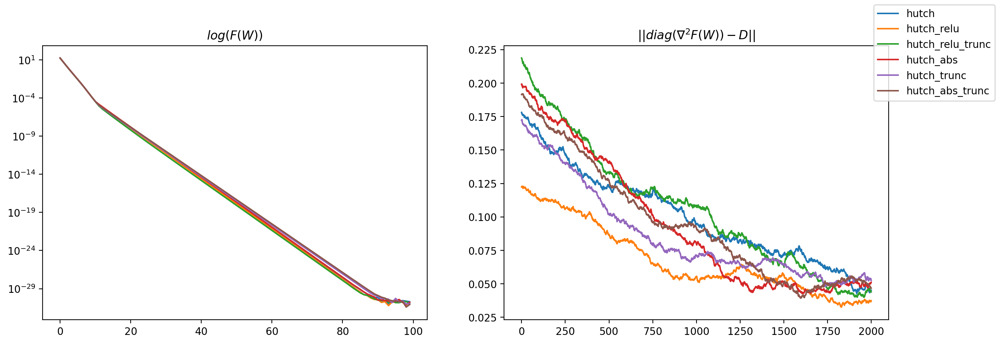

In [321]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=200)

ax1_trunc = 100
ax2_trunc = 2000

ax1.semilogy([x[0] for x in hist_hutch[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_hutch_relu[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_hutch_relu_trunc[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_hutch_abs[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_hutch_trunc[:ax1_trunc]])
ax1.semilogy([x[0] for x in hist_hutch_abs_trunc[:ax1_trunc]])

ax2.plot(diff_hutch[:ax2_trunc])
ax2.plot(diff_hutch_relu[:ax2_trunc])
ax2.plot(diff_hutch_relu_trunc[:ax2_trunc])
ax2.plot(diff_hutch_abs[:ax2_trunc])
ax2.plot(diff_hutch_trunc[:ax2_trunc])
ax2.plot(diff_hutch_abs_trunc[:ax2_trunc])

ax1.set_title(r"$ log(F(W)) $")
ax2.set_title(r"$\|\| diag(\nabla^2 F(W)) - D  \|\|$")

# ax2.set_ylim(0, 2)

fig.legend(["hutch", "hutch_relu", "hutch_relu_trunc", "hutch_abs", "hutch_trunc", "hutch_abs_trunc"])

In [200]:
f, grad, hess = mse, grad_mse, hess_mse
# f, grad, hess = logreg, grad_logreg, hess_logreg

# SGD

In [201]:
def sgd(train_data, train_target, lr):

    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)   

    w = torch.zeros(train_data.shape[1]).requires_grad_()

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    diff = torch.norm(w.detach().cpu() - xopt)

    print(f"||x - xopt||: {diff.item()} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")


    hist = [[diff.item(), (torch.linalg.norm(g) ** 2).item()]]

    for step in range(EPOCHS):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)
            grad_norm_sq = torch.linalg.norm(g) ** 2

            with torch.no_grad():
                w.sub_(lr * g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        diff = torch.norm(w.detach().cpu() - xopt)

        print(f"||x - xopt||: {diff} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")

        hist.append([diff.item(), (torch.linalg.norm(g) ** 2 ).item()])

    return hist

In [202]:
hist_sgd = sgd(train_data, train_target, 0.005)

||x - xopt||: 5.742156689518558 | GradNorm^2: 427744.73952263943
||x - xopt||: 2.8370224091881715 | GradNorm^2: 63520.826507957645
||x - xopt||: 1.6962137456849822 | GradNorm^2: 16294.56931208942
||x - xopt||: 1.1134285744025363 | GradNorm^2: 5419.010771922795
||x - xopt||: 0.7773077415895843 | GradNorm^2: 2098.300846129053
||x - xopt||: 0.5679720770554315 | GradNorm^2: 909.4712514559816
||x - xopt||: 0.4293840429247404 | GradNorm^2: 432.99863605869086
||x - xopt||: 0.3327912033748079 | GradNorm^2: 223.2417695778549
||x - xopt||: 0.2625640154306789 | GradNorm^2: 122.95571473097472
||x - xopt||: 0.20977915688271573 | GradNorm^2: 71.40545326702426
||x - xopt||: 0.16909006934683188 | GradNorm^2: 43.21000566687327
||x - xopt||: 0.13713476218429269 | GradNorm^2: 26.973317880193996
||x - xopt||: 0.11169746581873519 | GradNorm^2: 17.22869266339713
||x - xopt||: 0.09125237212894684 | GradNorm^2: 11.189450366367877
||x - xopt||: 0.07470694768899336 | GradNorm^2: 7.354630826173801
||x - xopt||: 

# SPS

In [203]:
def sps(train_data, train_target):
    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)

    w = torch.zeros(train_data.shape[1]).requires_grad_()

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)
    diff = torch.norm(w.detach().cpu() - xopt)

    hist = [[diff.item(), (torch.linalg.norm(g) ** 2).item()]]

    for step in range(EPOCHS):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)
            grad_norm_sq = torch.linalg.norm(g) ** 2
            ps = loss / grad_norm_sq

            with torch.no_grad():
                w.sub_(ps * g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        diff = torch.norm(w.detach().cpu() - xopt)

        print(f"||x - xopt||: {diff} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")

        hist.append([diff.item(), (torch.linalg.norm(g) ** 2 ).item()])

    return hist

In [204]:
hist_sps = sps(train_data, train_target)

||x - xopt||: 3.27553266083247 | GradNorm^2: 97651.23313389727
||x - xopt||: 1.8915997588472286 | GradNorm^2: 22168.619190727553
||x - xopt||: 1.09054451741649 | GradNorm^2: 5058.990681464691
||x - xopt||: 0.6315343672188626 | GradNorm^2: 1141.360815738354
||x - xopt||: 0.365484181664882 | GradNorm^2: 256.09751943484724
||x - xopt||: 0.2037658215412072 | GradNorm^2: 59.536624279776376
||x - xopt||: 0.10660061142834239 | GradNorm^2: 14.576139108009087
||x - xopt||: 0.05373381163542148 | GradNorm^2: 3.634636359979176
||x - xopt||: 0.026929724197669088 | GradNorm^2: 0.913609989707331
||x - xopt||: 0.013552750240797547 | GradNorm^2: 0.24481657434297233
||x - xopt||: 0.0071995645576692505 | GradNorm^2: 0.10525554977200123
||x - xopt||: 0.004813237038400224 | GradNorm^2: 0.06121660195090957
||x - xopt||: 0.0034584029111779167 | GradNorm^2: 0.024997418501800348
||x - xopt||: 0.0023363598471907734 | GradNorm^2: 0.01424483056762935
||x - xopt||: 0.0016747157832000476 | GradNorm^2: 0.00594966453

In [205]:
def sps_max(train_data, train_target, lr_bound):

    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)

    w = torch.zeros(train_data.shape[1]).requires_grad_()

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)
    diff = torch.norm(w.detach().cpu() - xopt)

    hist = [[diff.item(), (torch.linalg.norm(g) ** 2).item()]]

    for step in range(EPOCHS):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)
            grad_norm_sq = torch.linalg.norm(g) ** 2
            ps = torch.minimum(loss / grad_norm_sq, torch.tensor(lr_bound))

            with torch.no_grad():
                w.sub_(ps * g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        diff = torch.norm(w.detach().cpu() - xopt)

        print(f"||x - xopt||: {diff} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")

        hist.append([diff.item(), (torch.linalg.norm(g) ** 2 ).item()])

    return hist

    

In [206]:
hist_sps_max = sps_max(train_data, train_target, 0.01)

||x - xopt||: 3.27553266083247 | GradNorm^2: 97651.2331338973
||x - xopt||: 1.8915997588472286 | GradNorm^2: 22168.619190727553
||x - xopt||: 1.09054451741649 | GradNorm^2: 5058.990681464691
||x - xopt||: 0.6315343672188628 | GradNorm^2: 1141.3608157383555
||x - xopt||: 0.3654841816648822 | GradNorm^2: 256.09751943484736
||x - xopt||: 0.21692277942580385 | GradNorm^2: 69.72689407987744
||x - xopt||: 0.1360468936313161 | GradNorm^2: 24.740495651466468
||x - xopt||: 0.08692077796579718 | GradNorm^2: 9.714320078218023
||x - xopt||: 0.055904549882880857 | GradNorm^2: 3.9586030921243487
||x - xopt||: 0.036050434083281235 | GradNorm^2: 1.6356547640309018
||x - xopt||: 0.023274827107369684 | GradNorm^2: 0.6797097614740772
||x - xopt||: 0.015035775674610796 | GradNorm^2: 0.28324134508665394
||x - xopt||: 0.009716648145157096 | GradNorm^2: 0.11823093382428503
||x - xopt||: 0.006280625220478033 | GradNorm^2: 0.049429500689354484
||x - xopt||: 0.004060307588473768 | GradNorm^2: 0.0207131079817610

# Diagonal of True Hessian
$B_t = diag(\nabla^2 F(w))$ 

$ w_{t+1} = \mathop{{\arg \min}}\limits_{w \in \mathbb{R}^d} \  \tfrac{1}{2} \|w - w_t\|_{B_t}^2  \quad \text{s.t.} \quad 
  f_i(w_t) + \langle \nabla f_i(w_t), w-w_t\rangle = 0 $

is given by

$w_{t+1} = w_t - \tfrac{f_i(w_t)}{{||\nabla f_i(w_t)||}_{B_t^{-1}}^2} B_t^{-1} \nabla f_i(w_t).$

In [207]:
def psps_hessdiag(train_data, train_target):

    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)

    w = torch.zeros(train_data.shape[1]).requires_grad_()
    hist = []

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)
    hessian = hess(w, train_data, train_target)

    diff = torch.norm(w.detach().cpu() - xopt)

    grad_norm_sq = torch.dot(g, g)

    print(f"||x - xopt||: {diff} | GradNorm^2: {grad_norm_sq.item()}")
    hist.append([diff.item(), grad_norm_sq.item()])



    for step in range(EPOCHS):
        
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)
            hessian = hess(w, train_data, train_target)
            hessdiag_inv = 1 / torch.diagonal(hessian)
            precond = hessdiag_inv

            weighted_grad_norm_sq = torch.dot(g, precond * g)

            ps = loss / weighted_grad_norm_sq
            
            with torch.no_grad():
                w.sub_(ps * precond * g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        grad_norm_sq = torch.dot(g, g)
        diff = torch.norm(w.detach().cpu() - xopt)

        print(f"||x - xopt||: {diff} | GradNorm^2: {grad_norm_sq.item()}")
        hist.append([diff.item(), grad_norm_sq.item()])

    return hist


In [208]:
hist_psps_diaghess = psps_hessdiag(train_data, train_target)

||x - xopt||: 5.742156689518558 | GradNorm^2: 427744.7395226394
||x - xopt||: 3.1574503353149885 | GradNorm^2: 99973.42519904432
||x - xopt||: 1.782946255021286 | GradNorm^2: 22852.915574809063
||x - xopt||: 1.0368925348003135 | GradNorm^2: 5136.105068292436
||x - xopt||: 0.6139959387000362 | GradNorm^2: 1158.9787781104337
||x - xopt||: 0.36048705475442744 | GradNorm^2: 263.87632250426606
||x - xopt||: 0.20276094907535605 | GradNorm^2: 60.984598586660766
||x - xopt||: 0.10664834592557192 | GradNorm^2: 14.947699836359925
||x - xopt||: 0.053869655632437584 | GradNorm^2: 3.7280645904626954
||x - xopt||: 0.027004082633949357 | GradNorm^2: 0.9574522473558169
||x - xopt||: 0.013708008824805776 | GradNorm^2: 0.2531791571475089
||x - xopt||: 0.007238027926235523 | GradNorm^2: 0.09713482593748721
||x - xopt||: 0.0045545253475823815 | GradNorm^2: 0.046208582504093196
||x - xopt||: 0.0030847625611448173 | GradNorm^2: 0.019598554786932093
||x - xopt||: 0.0020419849945335004 | GradNorm^2: 0.0090877

# PSPS

In [209]:
def psps_hutch(train_data, train_target, init_iters, step_iters):

    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)

    w = torch.zeros(train_data.shape[1]).requires_grad_()
    hist = []

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)
    hessian = hess(w, train_data, train_target)
    hessian_inv = torch.inverse(hessian)


    alpha=0.1
    beta=0.999

    Dk = diag_estimate_old(w, g, init_iters)
    vk = diag_estimate_old(w, g, step_iters)

    # Smoothing and Truncation 
    Dk = beta * Dk + (1 - beta) * vk
    Dk_hat = torch.abs(Dk)
    Dk_hat[Dk_hat < alpha] = alpha
    Dk_hat_inv = 1 / Dk_hat


    grad_norm_sq = torch.dot(g, g)

    print(f"Loss: {loss.item()} | GradNorm^2: {grad_norm_sq.item()}")
    hist.append([loss.item(), grad_norm_sq.item()])

    precond_diff = [torch.norm(Dk_hat_inv - torch.diagonal(hessian_inv)).item()]

    for step in range(EPOCHS):
        
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)

            vk = diag_estimate_old(w, g, step_iters)

            # Smoothing and Truncation 
            Dk = beta * Dk + (1 - beta) * vk
            Dk_hat = torch.abs(Dk)
            Dk_hat[Dk_hat < alpha] = alpha
            Dk_hat_inv = 1 / Dk_hat

            weighted_grad_norm_sq = torch.dot(g, Dk_hat_inv * g)

            ps = loss / weighted_grad_norm_sq
            
            with torch.no_grad():
                w.sub_(ps * Dk_hat_inv * g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        grad_norm_sq = torch.dot(g, g)

        print(f"Loss: {loss.item()} | GradNorm^2: {grad_norm_sq.item()}")
        hist.append([loss.item(), grad_norm_sq.item()])


        precond_diff.append(torch.norm(Dk_hat_inv - torch.diagonal(hessian_inv)).item())

    return hist, precond_diff

# Newton's Method

In [210]:
def nm(train_data, train_target):

    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)
        
    w = torch.zeros(train_data.shape[1]).requires_grad_()

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    diff = torch.norm(w.detach().cpu() - xopt)

    hist = [[diff.item(), (torch.linalg.norm(g) ** 2).item()]]

    for step in range(EPOCHS):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)
            hessian = hess(w, batch_data, batch_target)
            hessian_inv = torch.inverse(hessian)

            with torch.no_grad():
                w.sub_(hessian_inv @ g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        diff = torch.norm(w.detach().cpu() - xopt)

        print(f"|| x - xopt ||: {diff} | GradNorm^2: {(torch.linalg.norm(g) ** 2 ).item()}")

        hist.append([diff.item(), (torch.linalg.norm(g) ** 2 ).item()])

    return hist

# PSPS Preconditioned by $V^{-1}V^{-1}$

In [211]:
def psps_vv(train_data, train_target, scaling_vec=None):

    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)

    w = torch.zeros(train_data.shape[1]).requires_grad_()
    hist = []

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)
    hessian = hess(w, train_data, train_target)

    diff = torch.norm(w.detach().cpu() - xopt)

    grad_norm_sq = torch.dot(g, g)

    print(f"||x - xopt||: {diff} | GradNorm^2: {grad_norm_sq.item()}")
    hist.append([diff.item(), grad_norm_sq.item()])

    if scaling_vec == None:
        scaling_vec = torch.ones(train_data.shape[1])

    precond = (1 / scaling_vec) * (1 / scaling_vec)

    for step in range(EPOCHS):
        
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)
            
            weighted_grad_norm_sq = torch.dot(g, precond * g)

            ps = loss / weighted_grad_norm_sq
            
            with torch.no_grad():
                w.sub_(ps * precond * g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        grad_norm_sq = torch.dot(g, g)
        diff = torch.norm(w.detach().cpu() - xopt)

        print(f"||x - xopt||: {diff} | GradNorm^2: {grad_norm_sq.item()}")
        hist.append([diff.item(), grad_norm_sq.item()])

    return hist


In [212]:
hist_psps_vv = psps_vv(train_data, train_target)

||x - xopt||: 5.742156689518558 | GradNorm^2: 427744.7395226394
||x - xopt||: 3.2755326608324697 | GradNorm^2: 97651.2331338973
||x - xopt||: 1.8915997588472284 | GradNorm^2: 22168.61919072755
||x - xopt||: 1.0905445174164898 | GradNorm^2: 5058.990681464687
||x - xopt||: 0.6315343672188627 | GradNorm^2: 1141.3608157383546
||x - xopt||: 0.3654841816648821 | GradNorm^2: 256.0975194348472
||x - xopt||: 0.20376582154120731 | GradNorm^2: 59.536624279776404
||x - xopt||: 0.10660061142834236 | GradNorm^2: 14.576139108009096
||x - xopt||: 0.053733811635421506 | GradNorm^2: 3.634636359979179
||x - xopt||: 0.02692972419766928 | GradNorm^2: 0.9136099897073797
||x - xopt||: 0.013552750240798227 | GradNorm^2: 0.2448165743431108
||x - xopt||: 0.007199564557672689 | GradNorm^2: 0.10525554977233897
||x - xopt||: 0.004813237038406442 | GradNorm^2: 0.06121660195095772
||x - xopt||: 0.003458402911181078 | GradNorm^2: 0.024997418501898065
||x - xopt||: 0.0023363598471944596 | GradNorm^2: 0.014244830567654

In [213]:
hist_psps_vv_scaled = psps_vv(train_data_scaled, train_target_scaled, scaling_vec)

RuntimeError: The size of tensor a (100) must match the size of tensor b (20) at non-singleton dimension 0

In [ ]:
hist_sgd_scaled = sgd(train_data_scaled, train_target_scaled, 1e-7)

||x - xopt||: 9.762544884917334 | GradNorm^2: 3886616823.0127435
||x - xopt||: 9.760637084979384 | GradNorm^2: 2580300834.0482883
||x - xopt||: 9.7590021685729 | GradNorm^2: 1763159241.073688
||x - xopt||: 9.757584789697566 | GradNorm^2: 1242241038.7735686
||x - xopt||: 9.75634218203371 | GradNorm^2: 903083740.6953895
||x - xopt||: 9.755241110529154 | GradNorm^2: 677158777.2264632
||x - xopt||: 9.754255600429222 | GradNorm^2: 522992753.4556278
||x - xopt||: 9.753365234681104 | GradNorm^2: 415169657.0402969
||x - xopt||: 9.75255387047831 | GradNorm^2: 337889504.067008
||x - xopt||: 9.751808667131876 | GradNorm^2: 281171529.0980466
||x - xopt||: 9.751119346585735 | GradNorm^2: 238599284.4691845
||x - xopt||: 9.750477628666385 | GradNorm^2: 205969614.2727568
||x - xopt||: 9.749876798146808 | GradNorm^2: 180474861.4215205
||x - xopt||: 9.749311371629902 | GradNorm^2: 160202005.4866408
||x - xopt||: 9.748776840285387 | GradNorm^2: 143821815.29036388
||x - xopt||: 9.748269470415014 | GradNor

In [ ]:
hist_sps_scaled = sps(train_data_scaled, train_target_scaled)

||x - xopt||: 9.74229695436901 | GradNorm^2: 6036508752.312372
||x - xopt||: 9.749025421588986 | GradNorm^2: 2767159052.839676
||x - xopt||: 9.735025454233494 | GradNorm^2: 11154017905.105654
||x - xopt||: 9.74119771115001 | GradNorm^2: 203798030.71802226
||x - xopt||: 9.68482422181026 | GradNorm^2: 177955418317.18146
||x - xopt||: 9.697450071033625 | GradNorm^2: 38395513176.45945
||x - xopt||: 9.705255808040262 | GradNorm^2: 4384260076.554631
||x - xopt||: 9.713759004498748 | GradNorm^2: 3758543488.3794217
||x - xopt||: 9.7070638024348 | GradNorm^2: 4879148291.915782
||x - xopt||: 9.714686437109567 | GradNorm^2: 2776447227.0017595
||x - xopt||: 9.706438961455314 | GradNorm^2: 7926607377.784812
||x - xopt||: 9.713232375059794 | GradNorm^2: 567008603.4542311
||x - xopt||: 9.696751054158517 | GradNorm^2: 57690270047.64331
||x - xopt||: 9.705206581917313 | GradNorm^2: 9083901931.783846
||x - xopt||: 9.711631063863399 | GradNorm^2: 230132187.89894044
||x - xopt||: 9.680729593088039 | GradN

In [ ]:
hist_sps_max_scaled = sps_max(train_data_scaled, train_target_scaled, 0.01)

||x - xopt||: 9.74229695436901 | GradNorm^2: 6036508752.312372
||x - xopt||: 9.749025421588986 | GradNorm^2: 2767159052.8396783
||x - xopt||: 9.735025454233494 | GradNorm^2: 11154017905.105648
||x - xopt||: 9.74119771115001 | GradNorm^2: 203798030.71802303
||x - xopt||: 9.684824221810262 | GradNorm^2: 177955418317.18094
||x - xopt||: 9.697450071033625 | GradNorm^2: 38395513176.45928
||x - xopt||: 9.705255808040262 | GradNorm^2: 4384260076.554601
||x - xopt||: 9.713759004498748 | GradNorm^2: 3758543488.379466
||x - xopt||: 9.7070638024348 | GradNorm^2: 4879148291.915678
||x - xopt||: 9.714686437109567 | GradNorm^2: 2776447227.001897
||x - xopt||: 9.706438961455314 | GradNorm^2: 7926607377.784188
||x - xopt||: 9.713232375059796 | GradNorm^2: 567008603.4544419
||x - xopt||: 9.696751054158517 | GradNorm^2: 57690270047.62006
||x - xopt||: 9.705206581917317 | GradNorm^2: 9083901931.77828
||x - xopt||: 9.711631063863402 | GradNorm^2: 230132187.8999431
||x - xopt||: 9.68072959308812 | GradNorm

In [ ]:
hist_psps_diaghess_scaled = psps_hessdiag(train_data_scaled, train_target_scaled)

||x - xopt||: 9.762544884917334 | GradNorm^2: 3886616823.012745
||x - xopt||: 88.24521210122244 | GradNorm^2: 745714238.7659274
||x - xopt||: 125.55634432924306 | GradNorm^2: 60210048.58764717
||x - xopt||: 167.2425925375947 | GradNorm^2: 19088760.422998846
||x - xopt||: 209.606000612085 | GradNorm^2: 88910750.21534967
||x - xopt||: 209.85431406816778 | GradNorm^2: 6749047.957026193
||x - xopt||: 250.27640874067455 | GradNorm^2: 101776115.44399199
||x - xopt||: 247.9596614098983 | GradNorm^2: 5923942.865156205
||x - xopt||: 261.95890255800566 | GradNorm^2: 71214774.3699561
||x - xopt||: 264.54756046829937 | GradNorm^2: 5107454.055623922
||x - xopt||: 273.4072655694777 | GradNorm^2: 36531810.94165405
||x - xopt||: 272.3414579558688 | GradNorm^2: 1238183.8692350697
||x - xopt||: 290.96882884269985 | GradNorm^2: 48211469.800212845
||x - xopt||: 291.0212358598574 | GradNorm^2: 5831593.231818841
||x - xopt||: 290.79527860065554 | GradNorm^2: 3353770.708778672
||x - xopt||: 291.9616166332054

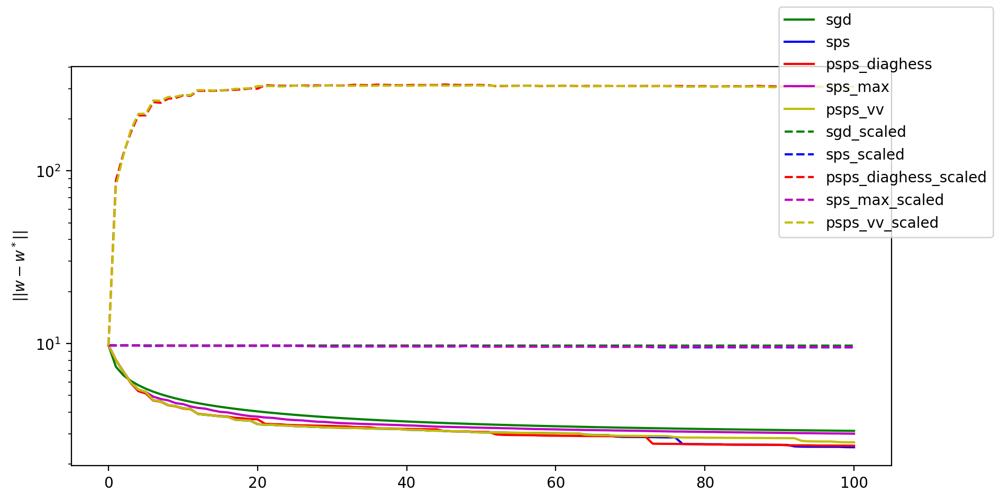

In [ ]:
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=200)

fig = plt.figure(figsize=(10, 5), dpi=200)

plt.semilogy([x[0] for x in hist_sgd], 'g', label="sgd")
plt.semilogy([x[0] for x in hist_sps], 'b', label="sps")
plt.semilogy([x[0] for x in hist_psps_diaghess], 'r', label="psps_diaghess")
plt.semilogy([x[0] for x in hist_sps_max], 'm', label="sps_max")
plt.semilogy([x[0] for x in hist_psps_vv], 'y', label="psps_vv")



plt.semilogy([x[0] for x in hist_sgd_scaled], 'g--', label="sgd_scaled")
plt.semilogy([x[0] for x in hist_sps_scaled], 'b--', label="sps_scaled")
plt.semilogy([x[0] for x in hist_psps_diaghess_scaled], 'r--', label="psps_diaghess_scaled")
plt.semilogy([x[0] for x in hist_sps_max_scaled], 'm--', label="sps_max_scaled")
plt.semilogy([x[0] for x in hist_psps_vv_scaled], 'y--', label="psps_vv_scaled")

plt.ylabel(r"$\|\| w - w^* \|\|$")

fig.legend()

plt.savefig("temptemp.jpeg")

In [ ]:
def test_hutch(train_data, train_target, lr, init_iters, step_iters):

    train_load = torch.utils.data.TensorDataset(train_data, train_target)
    train_dataloader = torch.utils.data.DataLoader(train_load, batch_size=batch_size, shuffle=True)

    def diag_estimate_test(weights, grad, iters):
        # Ds = []
        Ds = torch.zeros_like(weights)
        for j in range(iters):
            z = rademacher_old(weights)
            # with torch.no_grad():
            #     hvp = torch.matmul(hessian, z)
            with torch.no_grad():
                hvp = torch.autograd.grad(grad, weights, grad_outputs=z, retain_graph=True)[0]
            Ds.add_(hvp*z)
            # Ds.append((hvp*z))

        return Ds.div(iters)

        # return torch.mean(torch.stack(Ds), 0)
        
    w = torch.zeros(train_data.shape[1]).requires_grad_()

    loss = f(w, train_data, train_target)
    g = grad(w, train_data, train_target)

    diff = torch.norm(w.detach().cpu() - xopt)

    hist = [[diff.item(), (torch.linalg.norm(g) ** 2).item()]]

    hessian = hess(w, train_data, train_target)
    hessian_inv_diag = 1 / torch.inverse(hessian)


    alpha=0.1
    beta=0.9

    Dk = diag_estimate_test(w, g, init_iters)
    vk = diag_estimate_test(w, g, step_iters)

    # Smoothing and Truncation 
    Dk = beta * Dk + (1 - beta) * vk
    Dk_hat = torch.abs(Dk)
    Dk_hat[Dk_hat < alpha] = alpha
    Dk_hat_inv = 1 / Dk_hat

    print(torch.norm(hessian_inv_diag - Dk_hat_inv))

    for step in range(EPOCHS):
        for i, (batch_data, batch_target) in enumerate(train_dataloader):
            loss = f(w, batch_data, batch_target)
            g = grad(w, batch_data, batch_target)
            
            vk = diag_estimate_test(w, g, step_iters)
            
            # Smoothing and Truncation 
            Dk = beta * Dk + (1 - beta) * vk
            Dk_hat = torch.abs(Dk)
            Dk_hat[Dk_hat < alpha] = alpha
            Dk_hat_inv = 1 / Dk_hat

            with torch.no_grad():
                w.sub_(lr * g)

        loss = f(w, train_data, train_target)
        g = grad(w, train_data, train_target)
        diff = torch.norm(w.detach().cpu() - xopt)

        hutch_diff = torch.norm(hessian_inv_diag - Dk_hat_inv)

        print(f"norm(x - xopt): {diff} | norm(diag(Hessian) - Hutch): {hutch_diff}")

        hist.append([diff.item(), hutch_diff])

    return hist

In [ ]:
hist_hutch = test_hutch(train_data, train_target, 0.001, 1000, 1)

tensor(450.3053)
norm(x - xopt): 8.962436454409874 | norm(diag(Hessian) - Hutch): 450.3052135049233
norm(x - xopt): 8.393448182684534 | norm(diag(Hessian) - Hutch): 450.3062326592635
norm(x - xopt): 7.970436506401922 | norm(diag(Hessian) - Hutch): 450.3049270069397
norm(x - xopt): 7.642786345802189 | norm(diag(Hessian) - Hutch): 450.30446916497755
norm(x - xopt): 7.379791249180674 | norm(diag(Hessian) - Hutch): 450.30424514521474
norm(x - xopt): 7.162277772574966 | norm(diag(Hessian) - Hutch): 450.3041841975644
norm(x - xopt): 6.977876954999153 | norm(diag(Hessian) - Hutch): 450.3044105305065
norm(x - xopt): 6.81834168774757 | norm(diag(Hessian) - Hutch): 450.3043231336817
norm(x - xopt): 6.677997762989474 | norm(diag(Hessian) - Hutch): 450.3054433273424
norm(x - xopt): 6.552826977510604 | norm(diag(Hessian) - Hutch): 450.30357280968076
norm(x - xopt): 6.43990884139607 | norm(diag(Hessian) - Hutch): 450.3054850907403
norm(x - xopt): 6.3370706650558875 | norm(diag(Hessian) - Hutch): 450

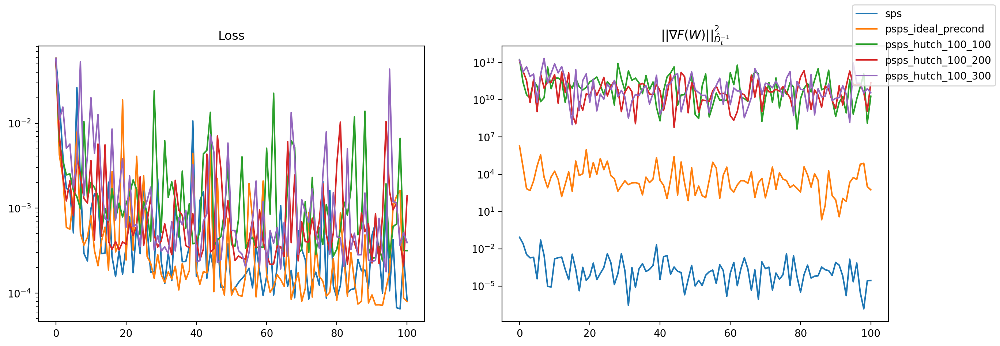

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), dpi=200)
ax1.semilogy([x[0] for x in hist_sps])
ax1.semilogy([x[0] for x in hist_psps_ideal])
ax1.semilogy([x[0] for x in hist_psps_hutch_100_100])
ax1.semilogy([x[0] for x in hist_psps_hutch_100_200])
ax1.semilogy([x[0] for x in hist_psps_hutch_100_300])
ax1.set_title("Loss")

ax2.semilogy([x[1] for x in hist_sps])
ax2.semilogy([x[1] for x in hist_psps_ideal])
ax2.semilogy([x[1] for x in hist_psps_hutch_100_100])
ax2.semilogy([x[1] for x in hist_psps_hutch_100_200])
ax2.semilogy([x[1] for x in hist_psps_hutch_100_300])

ax2.set_title(r"$\|\| \nabla F(W) \|\|^2_{\hat{D}^{-1}_t}$")

fig.legend(["sps", "psps_ideal_precond", "psps_hutch_100_100", "psps_hutch_100_200", "psps_hutch_100_300"])

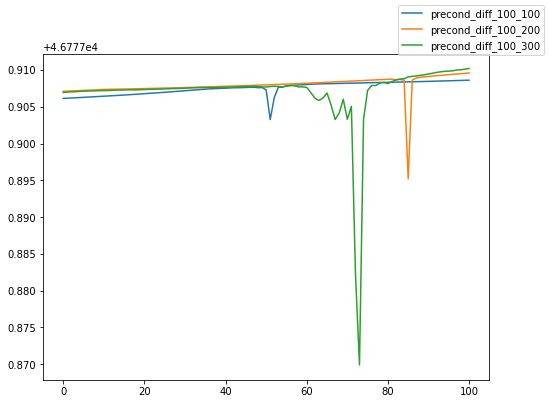

In [ ]:
fig = plt.figure(figsize=(8, 6))

plt.plot(precond_diff_100_100)
plt.plot(precond_diff_100_200)
plt.plot(precond_diff_100_300)

fig.legend(["precond_diff_100_100", "precond_diff_100_200", "precond_diff_100_300"])
